# iHS genome-wide selection scans

This notebook runs genome-wide selection scans.

In [1]:
%run setup.ipynb

In [2]:
for pop, config in pop_defs.items():
    print(pop, 
          len(df_haps_a.query(config['query'])))

ao_col 156
bf_col 150
bf_gam 184
ci_col 142
cm_sav_gam 192
fr_gam 48
ga_gam 138
gh_col 110
gh_gam 24
gm 130
gn_gam 80
gq_gam 18
gw 182
ke 96
ug_gam 224


In [3]:
def load_haplotypes(pop, chromosome, min_mac=2):
    
    # setup haplotypes
    if chromosome == 'X':
        loc_haps = df_haps_x.query(pop_defs[pop]['query']).index.values
        pos = callset_haps[chromosome]['variants/POS'][:]
        ht = allel.GenotypeDaskArray(callset_haps[chromosome]['calldata/GT']).to_haplotypes()
        ht_pop = da.take(ht, loc_haps, axis=1).compute()
        
    else:
        # concatenate data from both arms
        # remember, right arm goes on the left
        loc_haps = df_haps_a.query(pop_defs[pop]['query']).index.values
        arm_r = f'{chromosome}R'
        arm_l = f'{chromosome}L'
        pos_r = callset_haps[arm_r]['variants/POS'][:]
        pos_l = callset_haps[arm_l]['variants/POS'][:]
        pos = np.concatenate([pos_r, pos_l + len(genome[arm_r])])
        ht_r = allel.GenotypeDaskArray(callset_haps[arm_r]['calldata/GT']).to_haplotypes().values
        ht_l = allel.GenotypeDaskArray(callset_haps[arm_l]['calldata/GT']).to_haplotypes().values
        ht = da.concatenate([ht_r, ht_l], axis=0)
        ht_pop = da.take(ht, loc_haps, axis=1).compute()

    # remove non-segregating variants
    ac = allel.HaplotypeArray(ht_pop).count_alleles(max_allele=1)
    loc_seg = ac.min(axis=1) >= min_mac
    ht_seg = ht_pop.compress(loc_seg, axis=0)
    pos_seg = pos.compress(loc_seg, axis=0)
    ac_seg = ac.compress(loc_seg, axis=0)
    
    return pos_seg, ht_seg, ac_seg

In [4]:
def compute_ihs(pop, chromosome, min_mac=2, min_ehh=0.05, min_maf=0.05, max_gap=10_000, gap_scale=1_000, include_edges=True):

    # run ihs scan
    pos, ht, ac = load_haplotypes(pop=pop, chromosome=chromosome, min_mac=min_mac)
    gpos = np.take(gmap[chromosome], pos-1)
    ihs = allel.ihs(ht, pos, map_pos=gpos, min_ehh=min_ehh, min_maf=min_maf, max_gap=max_gap, gap_scale=gap_scale, include_edges=include_edges)

    # remove nans
    loc_nan = np.isnan(ihs)
    pos = pos[~loc_nan]
    gpos = gpos[~loc_nan]
    ihs = ihs[~loc_nan]
    ac = ac[~loc_nan]
    
    # standardise
    ihs_std, _ = allel.standardize_by_allele_count(ihs, ac[:, 1], diagnostics=False)
    assert not np.any(np.isnan(ihs_std))
    
    return pos, gpos, ihs, ihs_std, ac


In [5]:
ihs_root = zarr.open(str(here() / 'data/gwss/ihs/ihs.zarr'))

In [6]:
def run_ihs(pop, chromosome, min_mac=2, min_ehh=0.05, min_maf=0.05, 
            max_gap=10_000, gap_scale=1_000, include_edges=True, 
            window_size=200, window_step=100, markersize=1):
    
    # setup zarr group to store data
    grp_path = f'/{pop}/{chromosome}'
    grp = ihs_root.require_group(grp_path)
    complete = grp.attrs.get('complete', False)
    
    if complete:
        # previously run, load from zarr
        pos = grp['pos'][:]
        gpos = grp['gpos'][:]
        ihs = grp['ihs'][:]
        ihs_std = grp['ihs_std'][:]
        ac = grp['ac'][:]
        
    else:
        # run scan and save to zarr
        pos, gpos, ihs, ihs_std, ac = compute_ihs(pop=pop, chromosome=chromosome, min_mac=min_mac, min_ehh=min_ehh, min_maf=min_maf, max_gap=max_gap, gap_scale=gap_scale, include_edges=include_edges)
        grp.create_dataset('pos', data=pos, overwrite=True)
        grp.create_dataset('gpos', data=gpos, overwrite=True)
        grp.create_dataset('ihs', data=ihs, overwrite=True)
        grp.create_dataset('ihs_std', data=ihs_std, overwrite=True)
        grp.create_dataset('ac', data=ac, overwrite=True)
        grp.attrs['complete'] = True
    
    # diagnostics
    palette = sns.color_palette("Blues", 5)[1:]
    y_max = allel.moving_statistic(np.fabs(ihs_std), np.max, size=window_size, step=window_step)
    y_pc95 = allel.moving_statistic(np.fabs(ihs_std), lambda v: np.percentile(v, 95), size=window_size, step=window_step)
    y_pc75 = allel.moving_statistic(np.fabs(ihs_std), lambda v: np.percentile(v, 75), size=window_size, step=window_step)
    y_pc50 = allel.moving_statistic(np.fabs(ihs_std), np.median, size=window_size, step=window_step)

    # scale figures to chromosome size
    figwidth = pos.max()/1e7

    # plot in physical space
    x = allel.moving_statistic(pos, np.mean, size=window_size, step=window_step)
    fig, ax = plt.subplots(figsize=(figwidth, 3), facecolor='w')
    ax.plot(x, y_max, marker='o', linestyle=' ', markersize=markersize, color=palette[0], label='max')
    ax.plot(x, y_pc95, marker='o', linestyle=' ', markersize=markersize, color=palette[1], label='pc95')
    ax.plot(x, y_pc75, marker='o', linestyle=' ', markersize=markersize, color=palette[2], label='pc75')
    ax.plot(x, y_pc50, marker='o', linestyle=' ', markersize=markersize, color=palette[3], label='pc50')
    lgd = ax.legend(loc='upper left')
    for handle in lgd.legendHandles:
        handle._legmarker.set_markersize(6)
    ax.set_ylabel('$|iHS|$')
    xticks = ax.get_xticks()
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticks/1e6)
    ax.set_xlabel(f'Chromosome {chromosome} position (Mbp)')
    ax.set_title(f"{pop_defs[pop]['label']}")
    ax.set_xlim(0, pos[-1])
    ax.set_ylim(0, 10)

    # plot in genetic space
    x = allel.moving_statistic(gpos, np.mean, size=window_size, step=window_step)
    fig, ax = plt.subplots(figsize=(figwidth, 3), facecolor='w')
    ax.plot(x, y_max, marker='o', linestyle=' ', markersize=markersize, color=palette[0], label='max')
    ax.plot(x, y_pc95, marker='o', linestyle=' ', markersize=markersize, color=palette[1], label='pc95')
    ax.plot(x, y_pc75, marker='o', linestyle=' ', markersize=markersize, color=palette[2], label='pc75')
    ax.plot(x, y_pc50, marker='o', linestyle=' ', markersize=markersize, color=palette[3], label='pc50')
    ax.legend(loc='upper left')
    lgd = ax.legend(loc='upper left')
    for handle in lgd.legendHandles:
        handle._legmarker.set_markersize(6)
    ax.set_ylabel('$|iHS|$')
    xticks = ax.get_xticks()
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticks)
    ax.set_xlabel(f'Chromosome {chromosome} position (cM)')
    ax.set_title(f"{pop_defs[pop]['label']}")
    ax.set_xlim(0, gpos[-1])
    ax.set_ylim(0, 10)
    
    plt.show()
    plt.close()


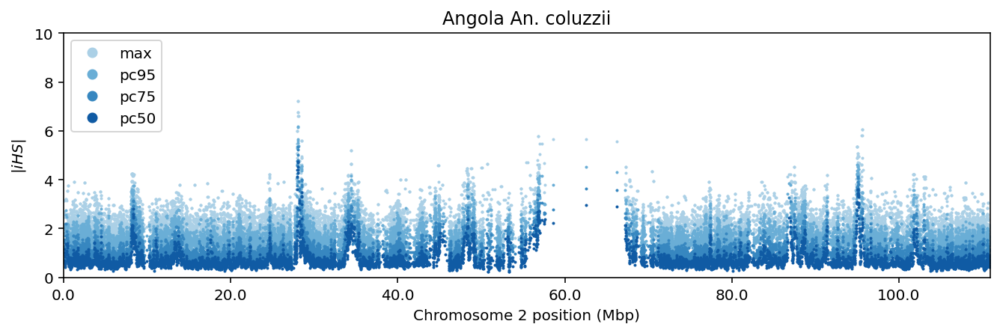

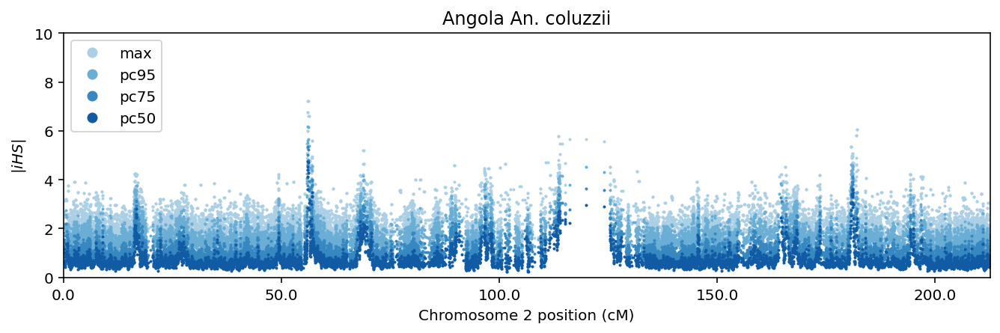

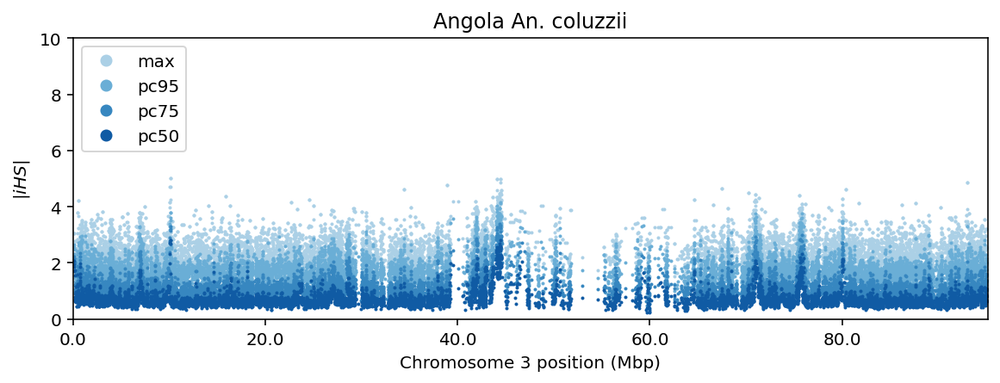

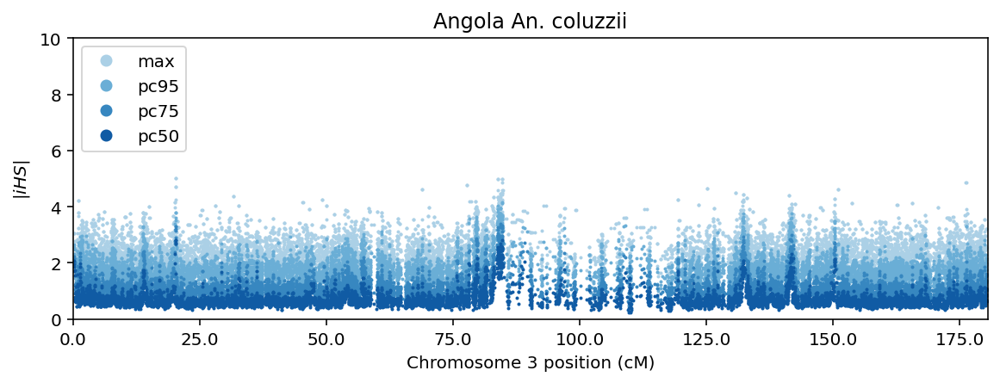

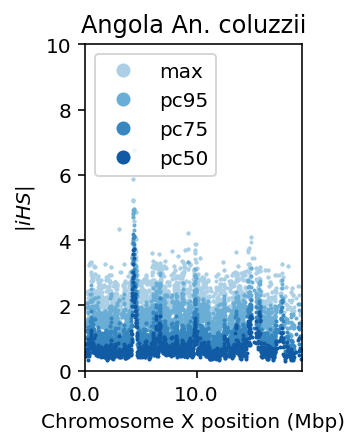

...

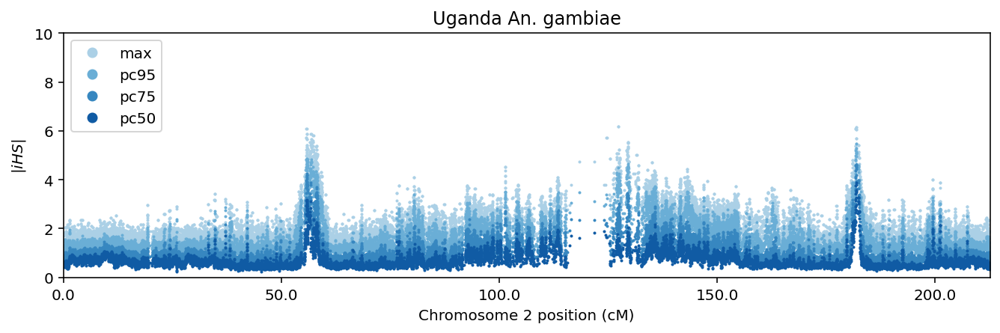

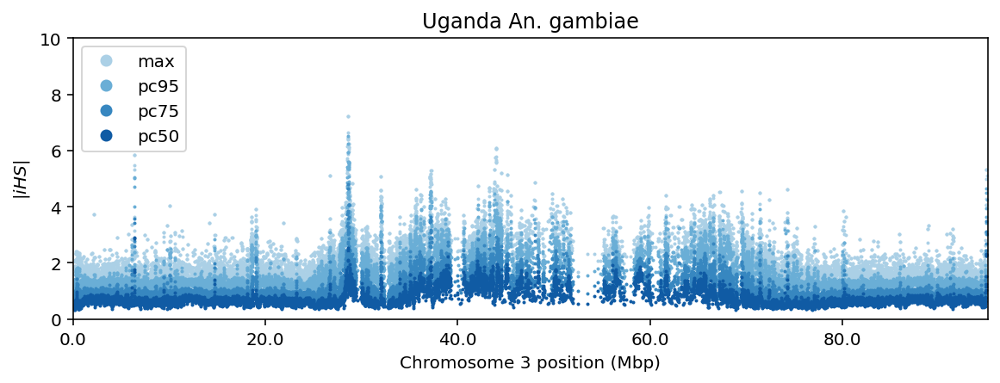

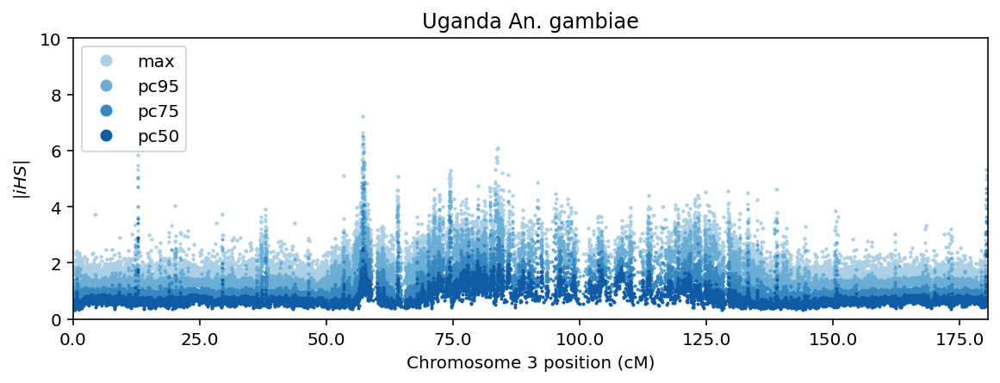

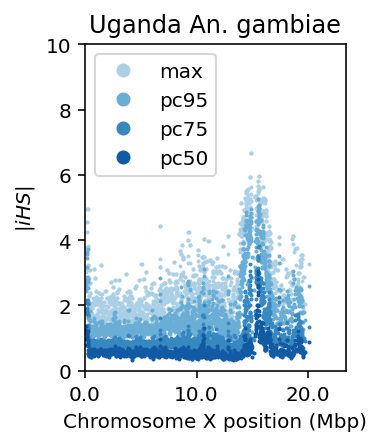

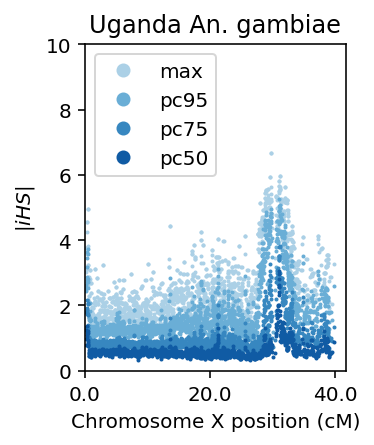

In [7]:
for pop in pop_defs:
    for chromosome in '2', '3', 'X':
        run_ihs(pop, chromosome)

In [8]:
print(ihs_root.tree())

/
 ├── ao_col
 │   ├── 2
 │   │   ├── ac (930295, 2) int32
 │   │   ├── gpos (930295,) float64
 │   │   ├── ihs (930295,) float64
 │   │   ├── ihs_std (930295,) float64
 │   │   └── pos (930295,) int32
 │   ├── 3
 │   │   ├── ac (897678, 2) int32
 │   │   ├── gpos (897678,) float64
 │   │   ├── ihs (897678,) float64
 │   │   ├── ihs_std (897678,) float64
 │   │   └── pos (897678,) int32
 │   └── X
 │       ├── ac (156495, 2) int32
 │       ├── gpos (156495,) float64
 │       ├── ihs (156495,) float64
 │       ├── ihs_std (156495,) float64
 │       └── pos (156495,) int32
 ├── bf_col
 │   ├── 2
 │   │   ├── ac (1286709, 2) int32
 │   │   ├── gpos (1286709,) float64
 │   │   ├── ihs (1286709,) float64
 │   │   ├── ihs_std (1286709,) float64
 │   │   └── pos (1286709,) int32
 │   ├── 3
 │   │   ├── ac (1126394, 2) int32
 │   │   ├── gpos (1126394,) float64
 │   │   ├── ihs (1126394,) float64
 │   │   ├── ihs_std (1126394,) float64
 │   │   └── pos (1126394,) int32
 │   └── X
 │       ├── 

In [9]:
zarr.consolidate_metadata(ihs_root.store)

<zarr.hierarchy.Group '/'>